# Introducing segment network v2
- Design of a new network SegmentNetwork layer where training parameters are still Weights and Bias butwe introduce a segment layer using chop such that each weight and bias line mirrors a segment. 
- Training data selection: train for x where loss is max for faster .
- how do we make sure only node that has max loss adjust max? or is that auotmatic based on gradient?

## Observations after tests
1. 

In [1]:
import math
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import torch
import torch.nn as nn
import torch.nn.functional as F

In [670]:
import platform
#to use mps on mac this should be >12.4 version and arm64
platform.mac_ver()

('14.1', ('', '', ''), 'arm64')

In [2]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using mps device


## functions that we are trying to approximate

In [4]:
np.random.seed(10)

# y = ax^4 + bx^3 + cx^2 + dx + f
def f_quarticn(x):
    a = -0.0179516
    b = 0.331323
    c = -1.53398
    d = -0.21107
    f = 5.73434
    x = x + 1
    return a*x**4 + b*x**3 + c*x**2 + d*x + f

def f_quartic(x):
    a = -0.0179516
    b = 0.331323
    c = -1.63398
    d = 1.01107
    f = 5.73434
    return a*x**4 + b*x**3 + c*x**2 + d*x + f
    
def f_inv_quartic(x):
    return 7 - f_quartic(x)
    
def f_semicircle(x):
    maxX = x.max()
    minX = x.min()
    radius = (maxX - minX)/2 
    center = (maxX + minX)/2 
    y = np.sqrt(np.abs(radius**2 - (x-center)**2))
    return y
    
def frand(y):
    return y + y*np.random.uniform(-0.1, 0.1, y.shape).astype('f')

def normalize(x,y):
    mu_x = torch.mean(x)
    std_x = torch.std(x)

    mu_y = torch.mean(y)
    std_y = torch.std(y)

    x_normalized = torch.nn.functional.normalize(x - mu_x, dim=0)
    y_normalized = torch.nn.functional.normalize(y - mu_y, dim=0)
    return x_normalized, y_normalized

In [1176]:
np.linalg.norm(xs - np.mean(xs))

127.57754994512172

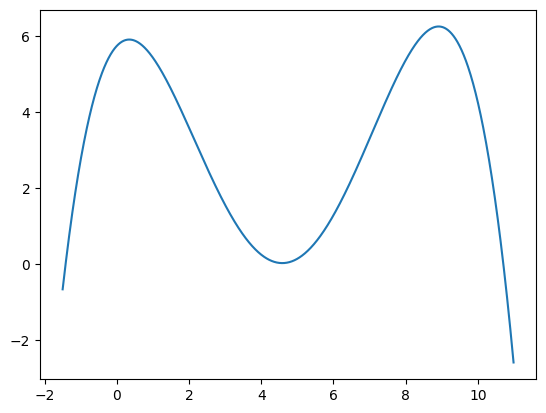

In [5]:
# show data for function 
f = f_quartic

xs = np.arange(-1.5, 11., .01)
#xs = np.arange(11, -1.5, -.01) # reverse order
ys = f(xs)
#yrand = frand(ys)

#plt.scatter(xs, yrand, color='red',s=1)
plt.plot(xs, ys)

torch.Size([1250, 1])

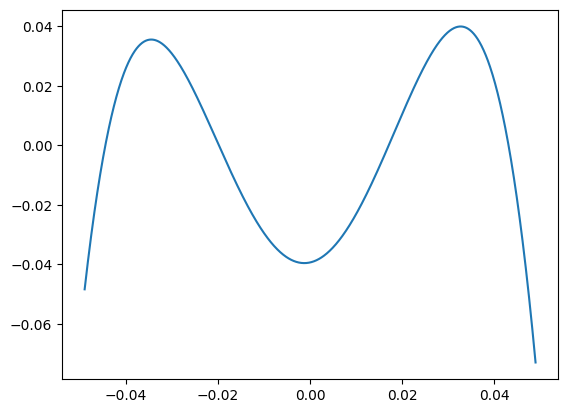

In [6]:
# Test with Tensor
xt = torch.tensor(xs.reshape(xs.shape[0],1), dtype=torch.float32)
yt = torch.tensor(ys.reshape(ys.shape[0],1), dtype=torch.float32)
xn, yn = normalize(xt,yt)
#ytrand = torch.tensor(yrand.reshape(yrand.shape[0],1), dtype=torch.float32)
#plt.scatter(xt, ytrand, color='red',s=1)
plt.plot(xn, yn)
xt.shape

## Define Data Loaders (InfiniteRandom and ExtremeLossFirst)

In [16]:
from torch.utils.data.dataloader import DataLoader

class InfiniteRandomDataLoader:

    def __init__(self, dataset, loss, replacement=True, **kwargs):
        train_sampler = torch.utils.data.RandomSampler(dataset, replacement=replacement, num_samples=int(1e10))
        self.train_loader = DataLoader(dataset, sampler=train_sampler, **kwargs)
        self.data_iter = iter(self.train_loader)

    def next(self):
        try:
            batch = next(self.data_iter)
        except StopIteration: # this will technically only happen after 1e10 samples... (i.e. basically never)
            self.data_iter = iter(self.train_loader)
            batch = next(self.data_iter)
        return batch


In [10]:
""" ExtremeLossFirstDataloader:
    init should be called in every epoc (ie when we exhaust all samples).
    in init() we find out loss and order data in reverse order of loss
    next() fetches batches of data in order of sorting.
"""
class ExtremeLossFirstDataloader:

    def __init__(self, dataset, loss, **kwargs):
        # sort dataset based on the loss
        sortedloss, indices = torch.sort(loss, dim=-2,descending=True) #reverse sort loss
        sorted_dataset = torch.index_select(x, 0, torch.reshape(indices,(indices.shape[0],)))
        self.train_loader = DataLoader(sorted_dataset, **kwargs)
        self.data_iter = iter(self.train_loader)

    def next(self):
        try:
            batch = next(self.data_iter)
        except StopIteration: # this will technically only happen after 1e10 samples... (i.e. basically never)
            self.data_iter = iter(self.train_loader)
            batch = next(self.data_iter)
        return batch

In [11]:
""" TopLossClusterDataloader:
    init should be called in every epoc (ie when we exhaust all samples).
    in init() we find out loss and create batches that are near the top loss (+- batchsize/2).
"""
class TopLossClusterDataloader:

    def __init__(self, dataset, loss, batch_size, **kwargs):
        # sort dataset based on the loss
        sortedloss, indices = torch.sort(loss, dim=-2,descending=True) #reverse sort loss
        self.batch_size = batch_size
        self.make_set(indices, dataset)
        #self.train_loader = DataLoader(toploss_dataset, **kwargs)
        #self.data_iter = iter(self.train_loader)

    def make_set(self, indices, dataset):
        index = indices[0]
        start = max(0, index - int(self.batch_size/2))
        stop = min(indices.max(), index + int(self.batch_size/2)) -1
        if start-stop < self.batch_size:
            if(start == 0):
                stop = start + self.batch_size
            elif (stop == indices.max()):
                start = stop - self.batch_size

        self.toploss_dataset = dataset[start:stop+1]
        return 
        
    def next(self):
        #try:
        batch = self.toploss_dataset
        #except StopIteration: # this will technically only happen after 1e10 samples... (i.e. basically never)
            #self.data_iter = iter(self.train_loader)
            #batch = next(self.data_iter)
        return batch

In [12]:
# test TopLossClusterDataloader
#dataLoader = TopLossClusterDataloader
#batch_loader = dataLoader(dataset,loss=alllosses, batch_size=64, pin_memory=True, num_workers=1)
#batch_loader.next()

In [13]:
""" TopNLossFirstDataloader:
    init should be called in every epoc (ie when we exhaust all samples).
    in init() we find out loss and order data in reverse order of loss, we use only top 20% of the data with most loss.
    next() fetches batches of data in order of sorting.
"""
class TopNLossFirstDataloader:

    def __init__(self, dataset, loss, **kwargs):
        # sort dataset based on the loss
        sortedloss, indices = torch.sort(allloss,dim=-2,descending=True) #reverse sort loss
        sorted_dataset = torch.index_select(x, 0, torch.reshape(indices,(indices.shape[0],)))
        topNpct = 64 #int(sorted_dataset.shape[0]*.2)
        train_sampler = torch.utils.data.RandomSampler(sorted_dataset[0:topNpct], replacement=True, num_samples=int(1e10))
        self.train_loader = DataLoader(dataset, sampler=train_sampler, **kwargs)
        self.data_iter = iter(self.train_loader)
        
    def next(self):
        try:
            batch = next(self.data_iter)
        except StopIteration: # this will technically only happen after 1e10 samples... (i.e. basically never)
            self.data_iter = iter(self.train_loader)
            batch = next(self.data_iter)
        return batch

## Define the neural network model

In [477]:
from torch import Tensor

class OneLayerSegmentNet(nn.Module):
    def __init__(self, in_features, segment_features, alpha=0.1):
        super(OneLayerSegmentNet, self).__init__()
        self.segment_features = segment_features
        self.in_features = in_features
        self.weight = nn.Parameter(torch.Tensor(segment_features, in_features))
        self.bias = nn.Parameter(torch.Tensor(segment_features))
        self.alpha = alpha

    def forward(self, x):
        y = torch.zeros(x.shape[0],1)
        #intersections store the X coordinates for intersection of consecutive segments (lines from weights)
        intersections = torch.Tensor(self.segment_features-1)

        #TODO: replace for loop with matrix if possible and necessary for performance
        for i in range(self.segment_features):
            yn = torch.matmul(x, self.weight[i]) + self.bias[i]
            yn = yn.unsqueeze(-1)
            #print("linear",yn.shape, yn)
            if(i+1 < self.segment_features): # clamp only N-1 segments in the end
                # if next line is parallel to previous line (no intersection) then ignore this
                if self.weight[i] == self.weight[i+1]:
                    continue
                    
                intersections[i] = (self.bias[i+1] - self.bias[i])/(self.weight[i] - self.weight[i+1])
                # use alpha to avoid vanishing gradient
                mask = torch.ones_like(x).masked_fill((x >= intersections[i]), self.alpha)
                
                #print("Mask min for Ci",intersections[i],mask)
                #print(yn.shape, mask.shape)
                yn =  yn*mask
                #print("Mask-max",yn)
                
            if(i-1 >= 0): # Clamp X the beginning only second segment onwards
                # Create mask for X
                mask = torch.ones_like(x).masked_fill((x < intersections[i-1]), self.alpha)
                #print("Mask min for intersections[i-1]",intersections[i-1],mask)
                yn =  yn*mask
                #print("Mask-min",yn)
            y += yn
            #print("Y=",y)
        #print (intersections)
        return y
            
    def extra_repr(self) -> str:
        return f'in_features={self.in_features}, segment_features={self.segment_features}'

In [18]:
# observation: Training is very sensitive to negative_slope, if you go outside 0.09 to 1.1 range for negative slope model stops learning
## couldn't train after normalizing
class OneHiddenLayerNet(nn.Module):
    def __init__(self, input_size, hidden1_size, output_size):
        super(OneHiddenLayerNet, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden1_size)
        self.fc2 = nn.Linear(hidden1_size, output_size)

    def forward(self, x):
        x = self.fc1(x)
        #x = x@self.fc1.weight.T + self.fc1.bias # this is what self.fc1(x) does
        x = F.leaky_relu(x, negative_slope=0.1)
        x = self.fc2(x)
        return x

In [ ]:
class TwoHiddenLayerNet(nn.Module):
    def __init__(self, input_size, hidden1_size, hidden2_size, output_size):
        super(TwoHiddenLayerNet, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden1_size)
        self.fc2 = nn.Linear(hidden1_size, hidden2_size)
        self.fc3 = nn.Linear(hidden2_size, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), negative_slope=0.1)
        x = F.leaky_relu(self.fc2(x), negative_slope=0.1)
        x = self.fc3(x)
        return x

In [16]:
# Hidden layer with Chop 
# Note ChopNet works, trains slowly and needs more understanding of why or how to train quickly
#needed normalizing?
class OneHiddenLayerChopNet(nn.Module):
    def __init__(self, input_size, hidden1_size, output_size):
        super(OneHiddenLayerChopNet, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden1_size)
        self.ch1 = Chop(hidden1_size, drop_slope=0.1)
        self.fc2 = nn.Linear(hidden1_size, output_size)

    def forward(self, x):
        x = self.fc1(x)
        x = self.ch1(x)
        x = self.fc2(x)
        return x

## Model helper functions

In [483]:
# Define your weight initialization function - Didn't work well. only default init (without this function worked best)
def custom_init(model):
    for m in model.modules():
        if isinstance(m, nn.Linear):
            nn.init.normal_(m.weight, -10, 10)
            nn.init.constant_(m.bias, 0)
        else:
            nn.init.normal_(m.weight, -10, 10)

def get_model_param_grad(model):
    dt = {}
    for param in model.parameters():
        if(param.shape == (model.segment_features,1)):
            dt['weight_grad'] = param.grad
        else:
            dt['bias_grad'] = param.grad
    return dt

## Model Training with random data loader

### init training

In [756]:
# init training
import time
from torch.optim.lr_scheduler import ReduceLROnPlateau
import copy
from torch.utils.data import SequentialSampler

torch.manual_seed(10)
#model = OneHiddenLayerNet(1, 4, 1)

model = OneLayerSegmentNet(1, 4, alpha=0.0)
custom_init(model)

# Capture params after initialization
model_params = []
model_param_grads = []
model_params.append(copy.deepcopy(model.state_dict()))

# init optimizer
criterion = nn.MSELoss(reduction='sum')

#create ys data from scratch so we can sort xs as needed - made no different with randomloader for segmentnet
xs = np.arange(-1.5, 11., .05)
#xs = np.arange(11.,-1.5, -.01)

# appeend more data for x > 8 to see if it trains better # didn't help train segmentNet better for 4th neuron
#xs2 = np.arange(8., 11., .005)
#xs = np.append(xs, xs2)
#xs.sort()

ys = f(xs)
print(xs.shape, ys.shape)

x = torch.tensor((xs).reshape(xs.shape[0],1), dtype=torch.float32)
ytest = torch.tensor((ys).reshape(ys.shape[0],1), dtype=torch.float32) # y is from function / not randomized

#Test normalization - works
x, ytest = normalize(x, ytest)

dataLoader = InfiniteRandomDataLoader

# create dataset that can be used in a dataloader 
dataset = torch.utils.data.TensorDataset(x, ytest)

#initialize training params
step = 0
losses = np.array([])
with torch.no_grad():
    y = model(x)
    total_mean_loss = criterion(y, ytest)
#    losses = np.append(losses, total_mean_loss)
     
# optimizer an scheduler
# best results for OneHiddenLayerNet(1, 4, 1) : loss = 0.1775
# InfiniteRandomDataLoader,lr=0.1, patiene=100 in training loop[manual_seed(10),max_steps=2000, batch size=64, replacement=False]
# We can recreate above results by SequentialSampler but only with loop[manual_seed(10)] why does seed matter now?
# if we sort data in reverse and use SequentialSampler network trains to loss of 2.4 and still left most (lowerst X node) trains first.
# there is some affinity for network to train from lower values, is this initialization of bias?
# reversesort data and nomalize reverted the order of training. neuron with max X trained first only after base initialized to 0
# trains well (total_mean_loss 0.0440) after normalization with lr=0.05 and factor=.75, patience=500, 

# OneLayerSegmentNet(1, 4) training with loss( mse 'sum') : .03, 20000 steos
# nn.init.normal_(m.weight, -10, 10), xs = np.arange(11.,-1.5, -.01, normalization, lr=0.01, patience=4000, max_steps=2000, batch size=64 
# after torch.nn.functional.normalize sround mean,std
# OneLayerSegmentNet(1, 6) training with loss( mse 'sum') : .025, 20000 steos,  lr=0.01,

lr=.01
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, betas=(0.9, 0.999), eps=1e-8)
scheduler = ReduceLROnPlateau(optimizer, 'min', factor=.5, patience=10000,threshold=0.01, threshold_mode='rel', cooldown=0, 
                                                 min_lr=0, eps=1e-08, verbose=True) # let us try scheduler to reduce learning rate

(250,) (250,)


### Training loop

In [757]:
# training loop

torch.manual_seed(10)

best_loss = .01
prev_total_mean_loss = 100
max_steps = 20000

model.train() # We use this variable for training
# init dataloader
batch_loader = dataLoader(dataset,loss=total_mean_loss,replacement=False, batch_size=64, pin_memory=True, num_workers=1)

while True:
    t0 = time.time()
    # get the next batch, ship to device, and unpack it to input and target
    X, Y = batch_loader.next()
    #check for NaN
    if math.isnan(Y.mean()):
        print ("Breaking for NaN")
        break

    # Forward pass
    ypred = model(X)

    # Calculate the loss
    loss = criterion(ypred, Y)
    
    # Backward and optimize
    model.zero_grad(set_to_none=True)
    loss.backward()

    # Evaluate model after this optimizer.step
    # we evaluate on complete data
    with torch.no_grad():
        y = model(x)
        total_mean_loss = criterion(y, ytest)
    losses = np.append(losses, total_mean_loss)

    optimizer.step() #Definitely needed
    step += 1
    scheduler.step(total_mean_loss)
    t1 = time.time()

    # store params (weights and biases) after each training step
    #if step % 10 == 0:
    model_params.append(copy.deepcopy(model.state_dict()))
    model_param_grads.append(get_model_param_grad(model))
             
    # logging
    if step % 1000 == 0:         
        print(f"step {step} | loss {loss:.4f} | total_mean_loss {total_mean_loss:.4f} | step time {(t1-t0)*1000:.2f}ms")

    # termination conditions
    if max_steps >= 0 and step % max_steps == 0:
        break
        
    #if total_mean_loss.mean() < best_loss:
        break

    #if total_mean_loss.mean() > prev_total_mean_loss*1.5:
    #    break #we may want to change learning rate

    prev_total_mean_loss = total_mean_loss



step 1000 | loss 4.0953 | total_mean_loss 17.2407 | step time 0.81ms
step 2000 | loss 0.7883 | total_mean_loss 3.2968 | step time 0.81ms
step 3000 | loss 0.4537 | total_mean_loss 1.4871 | step time 0.81ms
step 4000 | loss 0.2719 | total_mean_loss 0.6999 | step time 0.80ms
step 5000 | loss 0.0851 | total_mean_loss 0.4023 | step time 0.80ms
step 6000 | loss 0.0763 | total_mean_loss 0.3361 | step time 0.81ms
step 7000 | loss 0.0412 | total_mean_loss 0.2495 | step time 0.82ms
step 8000 | loss 0.0261 | total_mean_loss 0.1261 | step time 0.80ms
step 9000 | loss 0.0224 | total_mean_loss 0.0816 | step time 0.80ms
step 10000 | loss 0.0193 | total_mean_loss 0.0590 | step time 0.80ms
step 11000 | loss 0.0116 | total_mean_loss 0.0472 | step time 0.82ms
step 12000 | loss 0.0106 | total_mean_loss 0.0403 | step time 0.79ms
step 13000 | loss 0.0083 | total_mean_loss 0.0374 | step time 0.80ms
step 14000 | loss 0.0091 | total_mean_loss 0.0343 | step time 0.79ms
step 15000 | loss 0.0071 | total_mean_loss

 prev_total_mean_loss  tensor(0.0323)


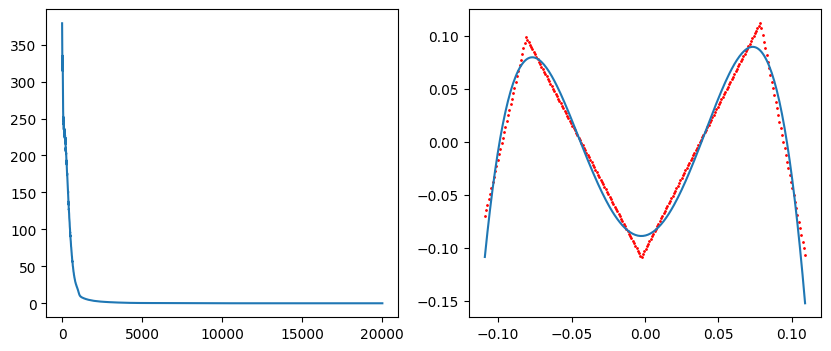

In [758]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10, 4) # this is done to increase width to 

# Create a figure and two axes objects
# Increase the figure size to accommodate wider plots
fig, (ax1, ax2) = plt.subplots(1, 2)

# plot loss
print (" prev_total_mean_loss ",prev_total_mean_loss)
ax1.plot(losses)

# plot trained model
y = model(x)
yout = y.data.reshape(xs.shape[0])
ax2.plot(x, ytest)
ax2.scatter(x, yout, color='red', s=1)

# Display the plot
plt.show()

### Print model computation graph
very useful to debug if backprop is working when you create your own modules

In [422]:
#!pip install torchviz
from torchviz import make_dot


# Generate a Graphviz object from the computation graph
graph = make_dot(loss, params=dict(model.named_parameters())) 

# Save the graph as a PDF or any other format if needed
graph.render("model_segment_graph")

'model_segment_graph.pdf'

## Analyzing model parameters and reconstructing graph with model parameters

### Drawing animation showing how training progress

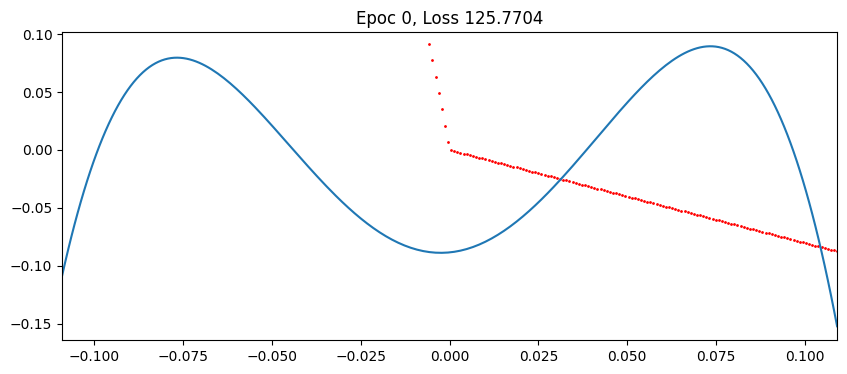

In [731]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

fig, ax = plt.subplots()
ax.set_xlim(x.min(), x.max())
#ax.set_ylim(ytest.min(), ytest.max())
ax.plot(x, ytest)
scatter = ax.scatter([], [], c='r', s=1)  # Initialize an empty scatter plot

def animate(i):
    model.load_state_dict(model_params[i])
    with torch.no_grad():
        model.eval() # be sure to call model.eval() method before inferencing to set the dropout and batch normalization layers to evaluation mode. Failing to do this will yield inconsistent inference results.
        y = model(x)
    yout = y.data.reshape(xs.shape[0])
    #ax.scatter(xs, yout, color='red', s=1)
    scatter.set_offsets(np.column_stack((x, yout)))
    ax.set_title(f"Epoc {i}, Loss {losses[1*(i)]:.4f}")

anim = FuncAnimation(fig, animate, frames=range(0,len(model_params)-1, 100))

from IPython.display import HTML
HTML(anim.to_jshtml())

In [721]:
# Save animation if necessary
anim.save("animation.gif")

### Analyze model parameter changes during training

#### plot movement of intersect


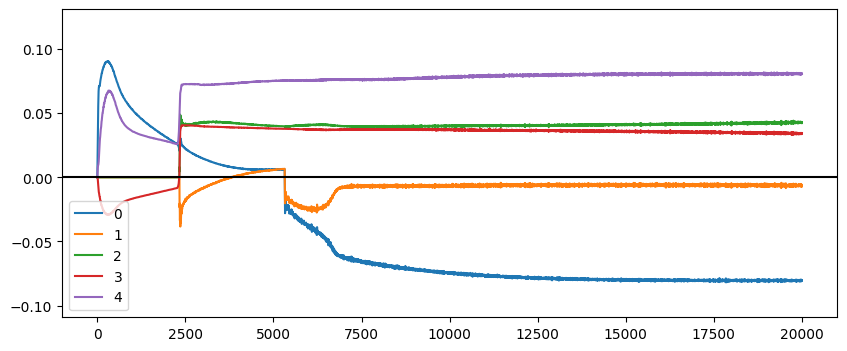

In [739]:
total_segments = len(model_params[0]['weight'])-1
all_intersects = []
for i in range(len(model_params)):
    intesects = []
    for j in range(total_segments):
        intersect = (model_params[i]['bias'][j+1] - model_params[i]['bias'][j])/(model_params[i]['weight'][j] - model_params[i]['weight'][j+1]) 
        intesects.append(intersect.numpy())
    all_intersects.append(intesects) 
intersects = np.array(all_intersects)

fig, ax = plt.subplots()
for i in range(total_segments):
    ax.plot(range(len(model_params)), intersects[:,i], label=i)
ax.legend()
ax.set_ylim(x.min(),x.max()*1.2)
ax.axhline(y=0, color='k')

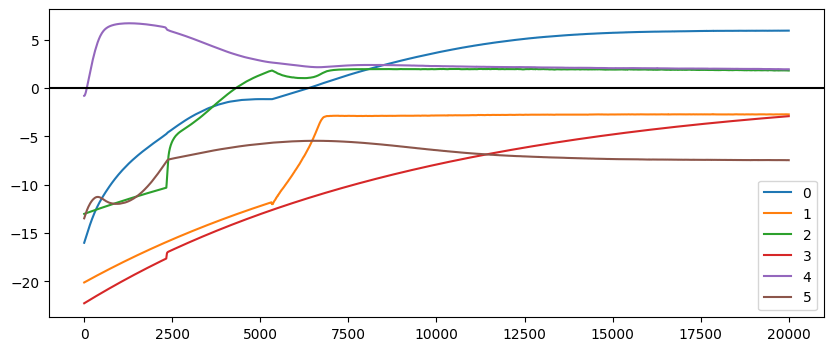

In [740]:
# movement of weights

weights = [0 for i in range(total_segments+1)]
for i in range(len(weights)):
    weights[i] = [weight for d in model_params for weight in d['weight'][i]]

fig, ax = plt.subplots()
for i in range(len(weights)):
    ax.plot(range(len(model_params)), weights[i],label=i)
ax.legend()
#ax.set_ylim(-5,5)
ax.axhline(y=0, color='k')

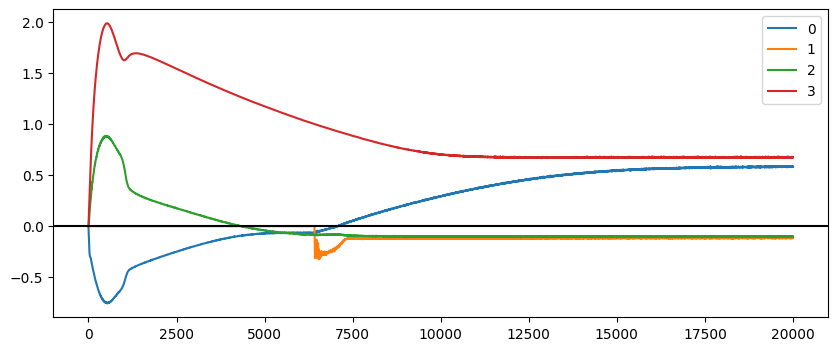

In [722]:
biases = [0 for i in range(total_segments+1)]
for i in range(len(biases)):
    biases[i] = [d['bias'][i] for d in model_params]

# movement of weights
fig, ax = plt.subplots()
for i in range(len(biases)):
    ax.plot(range(len(model_params)), biases[i],label=i)
ax.legend()
ax.axhline(y=0, color='k')

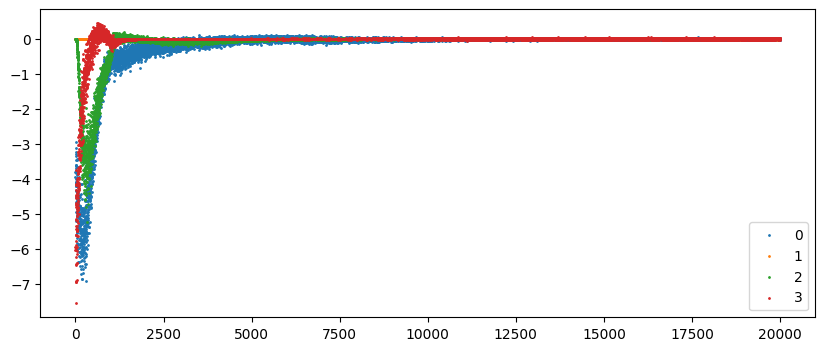

In [723]:
# plot gradients for weights
grads = [0 for i in range(total_segments+1)]
for i in range(len(grads)):
    grads[i] = [grad for d in model_param_grads for grad in d['weight_grad'][i]]

fig, ax = plt.subplots()
for i in range(len(grads)):
    ax.scatter(range(len(model_param_grads)), grads[i],label=i,s=1)
ax.legend()
#ax.set_ylim(-.02,.01)
#ax.axhline(y=0, color='k')

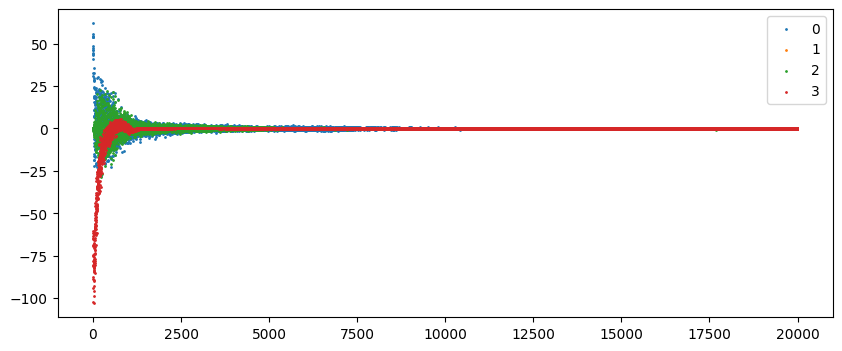

In [724]:
# plot gradients for weights
grads = [0 for i in range(total_segments+1)]
for i in range(len(grads)):
    grads[i] = [d['bias_grad'][i] for d in model_param_grads]

fig, ax = plt.subplots()
for i in range(len(grads)):
    ax.scatter(range(len(model_param_grads)), grads[i],label=i,s=1)
ax.legend()
#ax.set_ylim(-5,1)
#ax.axhline(y=0, color='k')

### debugging the forward path

In [ ]:
xt = np.array([0, 1, 2, 5, 10])
input = torch.tensor((xt).reshape(xt.shape[0],1), dtype=torch.float64)
ytest = model(input)
input, ytest

In [ ]:
#calculate the base and perpendicular of each segment
x_start = model.x_param[0:-1]
x_end = model.x_param[1:]
segment_widths = torch.abs(x_end - x_start)
x_start, x_end, segment_widths

In [ ]:
input_expanded = input.unsqueeze(1)
xi_bases = torch.abs(input_expanded - x_start) 
print(f"xi_bases shape, data \n {xi_bases.shape} ]\n {xi_bases}")

In [ ]:
torch.abs(x_end - input_expanded)

In [ ]:
xi_tot = torch.abs(x_end - input_expanded) + xi_bases
xi_tot,segment_widths

In [ ]:
x_mask = Tensor.le(xi_tot,segment_widths)
x_mask

In [ ]:
with torch.no_grad():
            input_min = input.min(dim=0).values.clone().detach()
            input_max = input.max(dim=0).values.clone().detach()
            self.x_min = torch.minimum(self.x_min,input_min)
            self.x_max = torch.maximum(self.x_max,input_max)
            #copy x_mon & x_max to the x_params
            self.x_param[0,:] = self.x_min
            self.x_param[-1,:] = self.x_max

        #calculate the base and perpendicular of each segment
        x_start = self.x_param[0:-1]
        x_end = self.x_param[1:]
        segment_widths = torch.abs(x_end - x_start)
       
        # find xi_base for each x value in the input tensor against each segment
        #print("input,x_start shape = ",input, x_start)
        input_expanded = input.unsqueeze(1)
        xi_bases = torch.abs(input_expanded - x_start) 
        #print("xi_bases shape, data = ",xi_bases.shape,xi_bases)
        
        # we also find the distance between x_end and x called x_extras.
        # if x falls between x_start and x_end then xi_bases + xi_extras should not be > segment_width
        # this is how we can find the correct segment for each x.
        xi_tot = torch.abs(x_end - input_expanded) + xi_bases
        #print("xi_tot,segment_widths")
        #print(xi_tot,segment_widths)
        x_mask = Tensor.le(xi_tot,segment_widths)
        #print(xi_bases*x_mask)
        x_factor = xi_bases*x_mask*segment_widths # x_factor is the propotional growth per segment
        #print("x_factor\n",x_factor)
        y_start = self.y_param[0:-1]
        y_end = self.y_param[1:]
        y_base = y_end - y_start
        #print("y_base.shape,x_factor.shape\n",y_base.shape,x_factor.shape)
        y_incr = y_base*x_factor
        #print("y_incr\n",y_incr.shape,y_incr)
        #print("y_start\n",y_start.shape,y_start)
        y_new = (y_incr + y_start)*x_mask
        y_new = y_new.sum(dim=-2)
        #print("y_new\n",y_new.shape,y_new)
        #y_new = ((y_incr + y_start)*x_mask).sum(dim=-1)

In [ ]:
# function to calulates forward pass for first layer and chop
def nnforward(x):
    with torch.no_grad():
        l1 = model.ch1(model.fc1(torch.tensor([x]))).numpy()[0]
        c1 = model.fc2.weight.numpy()[0]
        # individually multiple each value of l1 with c1 to get effect of each l1
        s = np.empty_like(l1)
        i=0
        for a,b in zip(l1, c1):
            s[i] = a*c1
            i+=1
    return s

def nnforward_exp(x):
    with torch.no_grad():
        l1 = model.ch1(torch.tensor([x])).numpy()[0]
        c1 = model.fc2.weight.numpy()[0]
        # individually multiple each value of l1 with c1 to get effect of each l1
        s = np.empty_like(l1)
        i=0
        for a,b in zip(l1, c1):
            s[i] = a*1
            i+=1
    return s
# test nnforward(10.)

In [ ]:
# Create an empty NumPy array
result_array = np.empty((0, model.fc1.out_features))  

for i in range(xs.shape[0]):
    new_data = nnforward_exp(float(xs[i]))
    result_array = np.append(result_array, [new_data], axis=0)

for i in range(model.fc1.out_features):
    plt.scatter(xs, result_array[:,i],s=1,label=i)

plt.legend()
plt.show()

In [ ]:
result_array.shape,new_data.shape

In [ ]:
result_array[:1000,0]

In [ ]:
range(xs.shape[0])

## Analyzing gradient of trained model for each X

In [ ]:
# load old model parameters
model.load_state_dict(model_params[0])
# We have to do model evaluation with grad
model.eval() # be sure to call model.eval() method before inferencing to set the dropout and batch normalization layers to evaluation mode. Failing to do this will yield inconsistent inference results.
y0 = model(x)
y0.retain_grad()
total_loss = criterion(y0, ytest)
total_loss.backward()
#x0_grad = x.grad.numpy()
y0_grad = y0.grad.numpy()

In [ ]:
# Final training
model.load_state_dict(model_params[4])
# We have to do model evaluation with grad
model.eval() # be sure to call model.eval() method before inferencing to set the dropout and batch normalization layers to evaluation mode. Failing to do this will yield inconsistent inference results.
yf = model(x)
yf.retain_grad()
total_loss = criterion(yf, ytest)
total_loss.backward()
#xf_grad = x.grad.numpy()
yf_grad = yf.grad.numpy()

### Obsesrvations & Learnings from y.grad analysis
Observations: yf.grad.numpy() appears to be very critical. we are minimizing this at every step.
 y0.grad.numpy() from an untrained model probably gives a very good glimpse of where the gaps are (same as loss)
 and where we should focus training.

Isn't yf.grad only showing loss at each x? So are we saying only train for value of X where loss is higher?

Another learning can be used to design a new network SegmentNetwork where training parameters are x0,y0 .. xn,yn
it has n-1 segments. we initialize the x0 and x1 based on min & max of x. 
we should also train for x where loss is max.
how do we make sure only node that has max loss adjust max? or is that auotmatic based on gradient?


In [ ]:
matplotlib.rcParams['figure.figsize'] = (8, 8) # this is done to increase width to 

# Create a figure and two axes objects
# Increase the figure size to accommodate wider plots
fig, (ax1, ax2) = plt.subplots(2, 1)

ax1.plot(xs,ys)
ax1.plot(xs,y0.detach().numpy(), color='r')
ax1.plot(xs,yf.detach().numpy(), color='g')

ax2.plot(xs,y0_grad, color='r')
ax2.plot(xs,yf_grad, color='g')
#ax2.set_ylim(-0.01,0.01)
ax2.axhline(y=0, color='k')

In [ ]:
# derivative of y = f(x)
# y = a*x**4 + b*x**3 + c*x**2 + d*x + f
def first_derivative(x):
    a = -0.0179516
    b = 0.331323
    c = -1.63398
    d = 1.01107
    f = 5.73434
    return 4*a*x**3 + 3*b*x**2 + 2*c*x + d

def second_derivative(x):
    a = -0.0179516
    b = 0.331323
    c = -1.63398
    d = 1.01107
    f = 5.73434
    return 12*a*x**2 + 6*b*x + 2*c

In [ ]:
matplotlib.rcParams['figure.figsize'] = (8, 6) # this is done to increase width to 

# Create a figure and two axes objects
# Increase the figure size to accommodate wider plots
fig, (ax1, ax2) = plt.subplots(2, 1)

ax1.plot(x,ytest)
ax2.plot(x,first_derivative(x))
ax2.plot(x,second_derivative(x))

# Scratch / Graveyard

In [ ]:
def chop(x):
    drop_slope = torch.tensor([0.1])
    alpha = torch.tensor([5.])
    y = torch.min(x,  alpha)
    y[y == alpha] = 0
    return y

In [ ]:
Xt = torch.tensor(range(10))
Yt = chop(Xt)
plt.plot(Xt, Yt)

In [ ]:
Xt, Yt

In [ ]:
model_params[0],model_params[-1]

In [ ]:
with torch.no_grad():
    x = 10.
    print(model.ch1(model.fc1(torch.tensor([x]))).numpy())
    print(model.fc2.weight.numpy())
    print((model.ch1(model.fc1(torch.tensor([x])))@model.fc2.weight.T).numpy(), model.fc2.bias.numpy())
    print(model(torch.tensor([x])).numpy())

In [ ]:
with torch.no_grad():
    X = model.ch1(model.fc1(torch.tensor([x]))).numpy()
    Y = model.fc2.weight.numpy()

In [ ]:
s = 0
for a,b in zip(X[0], Y[0]):
    s += a*b
    print(a*b,a,b)
print (s)

In [ ]:
for name, param in model.named_modules():
    print (f'name = {name}')
    print (f'param = {param}')

In [ ]:
# Show values of weights and biases
for name, param in model.named_parameters():
    if 'weight' in name:
        print(name, '\n', param)
    elif 'bias' in name:
        print(name, '\n', param)

In [ ]:
# Fetch model parameter by name
def fetch_param(name_in):
    for name, param in model.named_parameters():
        if name == name_in:
            weight_tensor = param
            break
    return weight_tensor.detach().numpy()

#leaky relu 
def lru(x):
    if(x < 0):
        return x*0.1
    return x
    
def nnforward(x):
    z11 = lru(x*fetch_param('fc1.weight')[0][0] + fetch_param('fc1.bias')[0])
    z12 = lru(x*fetch_param('fc1.weight')[1][0] + fetch_param('fc1.bias')[1])
    z13 = lru(x*fetch_param('fc1.weight')[2][0] + fetch_param('fc1.bias')[2])
    z14 = lru(x*fetch_param('fc1.weight')[3][0] + fetch_param('fc1.bias')[3])
    
    y1 = fetch_param('fc2.weight')[0,0] * z11
    y2 = fetch_param('fc2.weight')[0,1] * z12
    y3 = fetch_param('fc2.weight')[0,2] * z13
    y4 = fetch_param('fc2.weight')[0,3] * z14
    y5 = fetch_param('fc2.bias')[0]
    y = y1 + y2 + y3 + y4 + y5
    return y, z11, z12, z13, z14, y5

''' My Understanding
For a single layer network each neuron with RELU activation function
1. Represents a line with slope of 0 and another line with slope of fc1.weight*fc2.weight at that neuron.
2. The intesect of these two lines is at x = -fc1.bias/fc1.weight for each neuron in 1st layer.
3. The y value for this neuron is cumulative y of all the neuron lines
'''

In [ ]:
ynn = np.zeros_like(xs)
y1 = np.zeros_like(xs)
y2 = np.zeros_like(xs)
y3 = np.zeros_like(xs)
y4 = np.zeros_like(xs)
y5 = np.zeros_like(xs)

i = 0
for xi in xs:
    ynn[i], y1[i], y2[i], y3[i], y4[i], y5[i]  = nnforward(xi)
    i += 1

# plot trained model
#plt.plot(xs, ys)
#plt.scatter(xs, y2, color='red', s=1) #predicted
plt.scatter(xs, ynn,s=1,label='ynn') #forward prop
plt.scatter(xs, y1,s=1,label='1')
plt.scatter(xs, y2,s=1,label='2')
plt.scatter(xs, y3,s=1,label='3')
plt.scatter(xs, y4,s=1,label='4')
plt.scatter(xs, y5,s=1,label='5')
# Display the plot
plt.legend()
plt.show()